<a href="https://colab.research.google.com/github/sasidharvarada/Construction-Plan/blob/dev--pravallika/4_Nodes_SDS_Calibration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Basic

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
!pip install gpx-converter
from gpx_converter import Converter
from tabulate import tabulate
from functools import reduce


In [11]:
import pandas as pd

def remove_timezone(dt):
    return dt.replace(tzinfo=None)

def renaming_columns_avg(df1, avg, node_type='Inside'):
    df1['created_at'] = df1['created_at'].apply(remove_timezone)
    df1['Date'] = df1['created_at'].dt.date
    df1['Time'] = df1['created_at'].dt.time
    df1['created_at'] = pd.to_datetime(df1['created_at'])
    df1.set_index("created_at", inplace=True)
    # Resample, calculating the mean for numeric columns
    df1_resampled = df1.select_dtypes(include=['float64', 'int64']).resample(avg, label='right', closed='right').mean().round(3)

    # Drop NaN columns
    df1_resampled = df1_resampled.dropna(axis=1, how='all')
    # Drop unnecessary columns
    df1_resampled = df1_resampled.drop(['entry_id'], axis=1)

    # Convert all columns except 'created_at' to numeric
    # numeric_cols = df1_resampled.columns.drop('Date').drop('Time')
    # df1_resampled[numeric_cols] = df1_resampled[numeric_cols].apply(pd.to_numeric, errors='coerce')

    if node_type == 'Bus':
        df1_resampled = df1_resampled.rename(columns={'field1': 'PM2.5', 'field2': 'PM10', 'field3': 'Temperature', 'field4': 'Rh'})
        df1_resampled = df1_resampled[df1_resampled['PM10'] < 1000]
    elif node_type == 'Inside':
        df1_resampled = df1_resampled.rename(columns={'field1': 'Temperature', 'field2': 'RH', 'field3': 'PM2.5', 'field4': 'PM10',
                                  'field5': 'CO', 'field6': 'NO2', 'field7': 'NH3'})
    elif node_type == 'Airveda':
        df1_resampled = df1_resampled.rename(columns={'field1': 'AQI', 'field2': 'PM10', 'field3': 'PM2.5', 'field4': 'CO', 'field5': 'NOX'})

    return df1_resampled






# Handling raw data

In [12]:
# Load data
bn1 = pd.read_csv('/content/Main Gate.csv', parse_dates=['created_at'])
bn2 = pd.read_csv('/content/OBH.csv', parse_dates=['created_at'])
bn3 = pd.read_csv('/content/felicity.csv', parse_dates=['created_at'])
bn4 = pd.read_csv('/content/guest.csv', parse_dates=['created_at'])
# bn5 = pd.read_csv('/content/T_hub.csv', parse_dates=['created_at'])


In [13]:
bn1


,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:03+05:30,3045259,29.40,73.89,3.6,12.4,3.54,NaN,NaN
1,2024-09-10 22:00:47+05:30,3045260,29.38,73.86,3.5,13.7,2.42,NaN,NaN
2,2024-09-10 22:01:03+05:30,3045261,29.38,73.87,3.7,12.2,2.74,NaN,NaN
3,2024-09-10 22:01:48+05:30,3045262,29.34,73.87,3.5,12.1,2.26,NaN,NaN
4,2024-09-10 22:02:03+05:30,3045263,29.36,73.84,3.5,12.4,3.54,NaN,NaN
...,...,...,...,...,...,...,...,...,...
3296,2024-09-12 11:54:18+05:30,3048555,30.23,66.04,7.9,11.3,2.26,NaN,NaN
3297,2024-09-12 11:54:34+05:30,3048556,30.24,66.00,7.5,9.6,1.93,NaN,NaN
3298,2024-09-12 11:57:03+05:30,3048557,30.43,65.48,7.3,8.2,2.42,NaN,NaN
3299,2024-09-12 11:57:17+05:30,3048558,30.44,65.40,7.2,10.1,2.09,NaN,NaN


In [14]:
bn2

,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7,field8
0,2024-09-10 22:00:12+05:30,7846073,29.44,71.84,3.4,6.8,0.32,NaN,NaN,10-09-2024 16:30
1,2024-09-10 22:00:56+05:30,7846074,29.46,71.77,3.5,9.1,0.32,NaN,NaN,10-09-2024 16:30
2,2024-09-10 22:01:12+05:30,7846075,29.52,71.41,3.3,6.1,0.32,NaN,NaN,10-09-2024 16:31
3,2024-09-10 22:01:57+05:30,7846076,29.44,71.47,3.1,7.8,0.48,NaN,NaN,10-09-2024 16:31
4,2024-09-10 22:02:13+05:30,7846077,29.42,71.52,3.3,7.3,0.48,NaN,NaN,10-09-2024 16:32
...,...,...,...,...,...,...,...,...,...,...
4402,2024-09-12 11:57:28+05:30,7850475,28.70,69.99,9.2,10.2,0.64,NaN,NaN,12-09-2024 06:27
4403,2024-09-12 11:58:29+05:30,7850476,28.68,70.08,8.9,10.8,0.81,NaN,NaN,12-09-2024 06:28
4404,2024-09-12 11:58:45+05:30,7850477,28.71,70.06,8.8,9.7,0.64,NaN,NaN,12-09-2024 06:28
4405,2024-09-12 11:59:29+05:30,7850478,28.73,69.92,8.3,10.3,0.64,NaN,NaN,12-09-2024 06:29


In [15]:
bn3


,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:40+05:30,8200587,29.08,76.79,3.2,9.2,51.40,NaN,NaN
1,2024-09-10 22:00:56+05:30,8200588,29.03,76.99,3.2,10.0,52.53,NaN,NaN
2,2024-09-10 22:01:38+05:30,8200589,29.11,76.55,3.3,9.1,78.47,NaN,NaN
3,2024-09-10 22:01:54+05:30,8200590,29.14,76.31,3.5,12.2,50.43,NaN,NaN
4,2024-09-10 22:02:38+05:30,8200591,29.24,76.20,3.5,11.6,79.76,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4403,2024-09-12 11:57:07+05:30,8204990,30.42,66.32,9.0,12.7,57.20,NaN,NaN
4404,2024-09-12 11:57:51+05:30,8204991,30.45,66.47,9.3,14.8,57.04,NaN,NaN
4405,2024-09-12 11:58:07+05:30,8204992,30.59,65.96,8.9,14.2,57.20,NaN,NaN
4406,2024-09-12 11:58:52+05:30,8204993,30.74,65.45,9.2,15.4,55.59,NaN,NaN


In [16]:
bn4

,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:28+05:30,3012474,28.47,78.32,17.2,19.0,52.37,NaN,NaN
1,2024-09-10 22:00:44+05:30,3012475,28.45,78.31,17.0,19.0,52.85,NaN,NaN
2,2024-09-10 22:01:29+05:30,3012476,28.40,78.50,16.9,18.8,53.66,NaN,NaN
3,2024-09-10 22:01:44+05:30,3012477,28.40,78.46,16.6,18.4,70.25,NaN,NaN
4,2024-09-10 22:02:30+05:30,3012478,28.50,78.31,16.5,18.5,96.84,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4419,2024-09-12 11:57:30+05:30,3016893,29.51,68.77,14.7,19.6,47.53,NaN,NaN
4420,2024-09-12 11:58:15+05:30,3016894,29.53,68.68,14.9,19.4,47.05,NaN,NaN
4421,2024-09-12 11:58:30+05:30,3016895,29.51,68.59,15.2,20.0,48.02,NaN,NaN
4422,2024-09-12 11:59:14+05:30,3016896,29.56,68.56,15.1,19.3,47.21,NaN,NaN


In [17]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=bn1.index, y=bn1['PM10'], name='bn1'))
fig.add_trace(go.Scatter(x=bn2.index, y=bn2['PM10'], name='bn2'))
fig.add_trace(go.Scatter(x=bn3.index, y=bn3['PM10'], name='bn3'))
fig.add_trace(go.Scatter(x=bn4.index, y=bn4['PM10'], name='bn4'))
# fig.add_trace(go.Scatter(x=bn5.index, y=bn5['PM10'], name='bn5'))
fig.update_layout(title='Raw data PM10')
fig.update_xaxes()
fig.show()


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=bn1.index, y=bn1['PM2.5'], name='bn1'))
fig.add_trace(go.Scatter(x=bn2.index, y=bn2['PM2.5'], name='bn2'))
fig.add_trace(go.Scatter(x=bn3.index, y=bn3['PM2.5'], name='bn3'))
fig.add_trace(go.Scatter(x=bn4.index, y=bn4['PM2.5'], name='bn4'))
# fig.add_trace(go.Scatter(x=bn5.index, y=bn5['PM2.5'], name='bn5'))
fig.update_layout(title='Raw data PM2.5')
fig.update_xaxes()
fig.show()

# Removing Outliers

In [20]:
# Initialize empty DataFrames for further processing
bn_1 = pd.DataFrame()
bn_2 = pd.DataFrame()
bn_3 = pd.DataFrame()
bn_4 = pd.DataFrame()
# bn_5 = pd.DataFrame()

In [21]:
# Assign names to DataFrames
bn1.name = 'bn1'
bn2.name = 'bn2'
bn3.name = 'bn3'
bn4.name = 'bn4'
# bn5.name = 'bn5'

In [22]:

def outlier_removal(df, column_name, max_col_val, verbose=True, node_type='Outside'):


# calculate summary statistics

#     lc3_mean, lc3_std = np.mean(df[column_name]), np.std(df[column_name])

#     # identify outliers
#     cut_off = lc3_std * 3
#     lower, upper = lc3_mean - cut_off, lc3_mean + cut_off
#     #identifying outliers
#     outliers = [x for x in df[column_name] if x < lower or x > upper]
#     # remove outliers
#     outliers_removed = [x for x in df[column_name] if x > lower and x < upper]

#     uu_1  = df[df[column_name] > lower]
#     new_df = uu_1[uu_1[column_name] < upper]
    df = df[df[column_name]< max_col_val]
    # if Node_type == 'Outside':
    #     df = df[df['RH']<85]
    q25, q75 = np.percentile(df[column_name], 25), np.percentile(df[column_name], 75)
    iqr = q75 - q25
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off

    #identifying outliers
    outliers = [x for x in df[column_name] if x < lower or x > upper]

    # remove outliers
    outliers_removed = [x for x in df[column_name] if x > lower and x < upper]
    uu_1  = df[df[column_name] > lower]
    new_df = uu_1[uu_1[column_name] < upper]

    if verbose == True:
        print("cut off: ", cut_off)
        print("lower and upper boundaries: ", round(lower, 2), round(upper,2))
        #print("mean and standard deviation: ", lc3_mean, lc3_std)
        print('Identified outliers: %d' % len(outliers))
        print('Non-outlier observations: %d' % len(outliers_removed))
        print("q25,q75 ", q25, q75)

    return cut_off,round(lower, 2), round(upper,2), q25, q75, len(outliers),len(outliers_removed),new_df


In [23]:
dfs = [bn1, bn2, bn3, bn4]
new_dfs = [bn_1, bn_2, bn_3, bn_4]
dfs_s = ['bn1', 'bn2', 'bn3', 'bn4']
new_dfs_s = ['bn_1', 'bn_2', 'bn_3', 'bn_4']
nout = []
out = []

head = ["Node", "Cut_off", "Lower", "Upper", "Q25", "Q75", 'Outliers', "Non-out", "New_df"]
for i in range(len(dfs)):
    try:
        # Drop completely empty columns
        dfs[i] = dfs[i].dropna(axis=1, how='all')

        # Check if the dataframe is empty after dropping columns
        if dfs[i].empty:
            print(f"Dataframe {dfs_s[i]} is empty. Skipping to next dataframe...")
            continue

        cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_df = outlier_removal(dfs[i], column_name='PM10', max_col_val=999, verbose=False)
        new_dfs[i] = pd.concat([new_dfs[i], new_df], ignore_index=True)
        nout.append(non_outlier)
        out.append(outlier)


        mydata = [[dfs_s[i], cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_dfs_s[i]]]

        print(tabulate(mydata, headers=head, tablefmt="grid"))
        new_df.to_csv(f'{new_dfs_s[i]}_without_outliers.csv', index=False)
    except KeyError as e:
        print(f"KeyError occurred for dataframe {dfs_s[i]}: {e}. Skipping to next dataframe...")

print("non-outliers:", sum(nout))
print("outliers:", sum(out))




# dfs = [bn1, bn2, bn3, bn4]
# new_dfs = [bn_1, bn_2, bn_3, bn_4]
# dfs_s = ['bn1', 'bn2', 'bn3', 'bn4']
# new_dfs_s = ['bn_1', 'bn_2', 'bn_3', 'bn_4']
# nout = []
# out = []

# head = ["Node", "Cut_off", "Lower", "Upper", "Q25", "Q75", 'Outliers', "Non-out", "New_df"]
# for i in range(len(dfs)):
#     try:
#         # Drop completely empty columns
#         dfs[i] = dfs[i].dropna(axis=1, how='all')

#         # Check if the dataframe is empty after dropping columns
#         if dfs[i].empty:
#             print(f"Dataframe {dfs_s[i]} is empty. Skipping to next dataframe...")
#             continue

#         cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_df = outlier_removal(dfs[i], column_name='PM10', max_col_val=999, verbose=False)
#         new_dfs[i] = new_dfs[i].append(new_df)
#         nout.append(non_outlier)
#         out.append(outlier)

#         mydata = [[dfs_s[i], cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_dfs_s[i]]]

#         print(tabulate(mydata, headers=head, tablefmt="grid"))
#         new_df.to_csv(f'{new_dfs_s[i]}_without_outliers.csv', index=False)
#     except KeyError as e:
#         print(f"KeyError occurred for dataframe {dfs_s[i]}: {e}. Skipping to next dataframe...")

# print("non-outliers:", sum(nout))
# print("outliers:", sum(out))

+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
| Node   |   Cut_off |   Lower |   Upper |   Q25 |   Q75 |   Outliers |   Non-out | New_df   |
+========+===========+=========+=========+=======+=======+============+===========+==========+
| bn1    |       7.2 |    -2.7 |    16.5 |   4.5 |   9.3 |          9 |      3292 | bn_1     |
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
| Node   |   Cut_off |   Lower |   Upper |   Q25 |   Q75 |   Outliers |   Non-out | New_df   |
+========+===========+=========+=========+=======+=======+============+===========+==========+
| bn2    |       4.2 |     0.6 |    11.8 |   4.8 |   7.6 |         10 |      4397 | bn_2     |
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
+--------+-----------+---------+---------+-------+

# Handling modified files (Without Outliers)

In [24]:
bn_1_without_outliers = pd.read_csv('/content/bn_1_without_outliers.csv', parse_dates = ['created_at'])
bn_2_without_outliers = pd.read_csv('/content/bn_2_without_outliers.csv', parse_dates = ['created_at'])
bn_3_without_outliers = pd.read_csv('/content/bn_3_without_outliers.csv', parse_dates = ['created_at'])
bn_4_without_outliers = pd.read_csv('/content/bn_4_without_outliers.csv', parse_dates = ['created_at'])
# bn_5_without_outliers = pd.read_csv('/content/bn_5_without_outliers.csv', parse_dates = ['created_at'])

In [25]:
BN1 = renaming_columns_avg(bn_1_without_outliers, 'T', 'Inside')
BN2 = renaming_columns_avg(bn_2_without_outliers, 'T', 'Inside')
BN3 = renaming_columns_avg(bn_3_without_outliers, 'T', 'Inside')
BN4 = renaming_columns_avg(bn_4_without_outliers, 'T', 'Inside')
# BN5 = renaming_columns_avg(bn_5_without_outliers, 'T', 'Inside')

In [26]:
BN1

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,29.390,73.875,3.55,13.05,2.980
2024-09-10 22:02:00,29.360,73.870,3.60,12.15,2.500
2024-09-10 22:03:00,29.340,73.890,3.45,11.15,3.220
2024-09-10 22:04:00,29.325,73.950,3.65,12.25,2.500
2024-09-10 22:05:00,29.295,73.975,3.55,14.15,2.575
...,...,...,...,...,...
2024-09-12 11:56:00,NaN,NaN,NaN,NaN,NaN
2024-09-12 11:57:00,NaN,NaN,NaN,NaN,NaN
2024-09-12 11:58:00,30.435,65.440,7.25,9.15,2.255


In [27]:
BN2

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,29.450,71.805,3.45,7.95,0.320
2024-09-10 22:02:00,29.480,71.440,3.20,6.95,0.400
2024-09-10 22:03:00,29.355,71.880,3.25,7.05,0.400
2024-09-10 22:04:00,29.300,72.110,2.80,6.80,0.560
2024-09-10 22:05:00,29.295,71.945,2.25,4.40,1.125
...,...,...,...,...,...
2024-09-12 11:56:00,28.775,69.800,8.75,9.70,0.565
2024-09-12 11:57:00,28.735,69.920,8.35,9.20,0.480
2024-09-12 11:58:00,28.700,69.990,9.20,10.20,0.640


In [28]:
BN3

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,29.055,76.890,3.20,9.60,51.965
2024-09-10 22:02:00,29.125,76.430,3.40,10.65,64.450
2024-09-10 22:03:00,29.325,75.870,3.55,10.85,70.415
2024-09-10 22:04:00,29.565,74.745,3.70,10.20,58.735
2024-09-10 22:05:00,29.590,74.720,3.70,9.70,51.965
...,...,...,...,...,...
2024-09-12 11:56:00,30.680,65.470,9.30,13.15,56.480
2024-09-12 11:57:00,30.715,65.415,8.85,12.70,55.755
2024-09-12 11:58:00,30.435,66.395,9.15,13.75,57.120


In [29]:
BN4

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,28.460,78.315,17.10,19.00,52.610
2024-09-10 22:02:00,28.400,78.480,16.75,18.60,61.955
2024-09-10 22:03:00,28.490,78.225,16.50,18.45,84.515
2024-09-10 22:04:00,28.525,77.770,15.75,18.85,64.210
2024-09-10 22:05:00,28.460,78.275,15.15,17.40,50.110
...,...,...,...,...,...
2024-09-12 11:56:00,29.575,68.575,14.85,18.90,47.855
2024-09-12 11:57:00,29.540,68.690,15.40,18.60,47.860
2024-09-12 11:58:00,29.510,68.815,14.70,19.85,47.695


In [ ]:
BN5

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,28.480,76.340,2.15,8.40,59.055
2024-09-10 22:02:00,28.415,76.505,2.35,7.10,68.965
2024-09-10 22:03:00,28.530,76.620,2.50,6.70,66.465
2024-09-10 22:04:00,28.570,75.880,2.60,9.70,62.035
2024-09-10 22:05:00,28.620,75.790,2.40,8.20,60.420
...,...,...,...,...,...
2024-09-12 11:56:00,28.840,70.450,5.00,8.80,58.490
2024-09-12 11:57:00,28.870,70.305,5.00,8.65,58.970
2024-09-12 11:58:00,28.875,70.285,5.15,8.75,58.165


In [ ]:
# If not required, commented out
# BN1 = BN1.drop(['Temperature', 'RH'], axis=1)
# BN2 = BN2.drop(['Temperature', 'RH'], axis=1)


In [30]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM10'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM10'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM10'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM10'], name='BN4_without_outliers'))
# fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM10'], name='BN5_without_outliers'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
fig.update_xaxes()
# Show the plot
fig.show()

In [31]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM2.5'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM2.5'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM2.5'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM2.5'], name='BN4_without_outliers'))
# fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM2.5'], name='BN5_without_outliers'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='PM2.5 without Outliers')
fig.update_xaxes()
# Show the plot
fig.show()

# Handling Aeroqual Data

In [32]:
aero = pd.read_csv("/content/10_09_24_to_12_09_24 - 10_09_24_to_12_09_24.csv")

In [33]:
aero

,Date Time,Monitor ID,Location ID,PM10(ppm),PM2.5(ppm)
0,10 Sep 2024 22:27,2,1,0.008,0.004
1,10 Sep 2024 22:28,2,1,0.007,0.004
2,10 Sep 2024 22:29,2,1,0.008,0.004
3,10 Sep 2024 22:30,2,1,0.009,0.004
4,10 Sep 2024 22:31,2,1,0.011,0.004
...,...,...,...,...,...
2361,12 Sep 2024 13:48,2,1,0.013,0.010
2362,12 Sep 2024 13:49,2,1,0.016,0.008
2363,12 Sep 2024 13:50,2,1,0.012,0.007
2364,12 Sep 2024 13:51,2,1,0.014,0.007


In [34]:
aero = aero.rename(columns = {'Date Time': 'created_at'})
aero['created_at'] = pd.to_datetime(aero['created_at'], dayfirst = True)

In [35]:
aero.dtypes
aero = aero.drop(['Monitor ID', 'Location ID'], axis=1)

In [36]:
aero['PM10_ppb'] = aero['PM10(ppm)']*1000
aero['PM2.5_ppb'] = aero['PM2.5(ppm)']*1000

In [37]:
aero

,created_at,PM10(ppm),PM2.5(ppm),PM10_ppb,PM2.5_ppb
0,2024-09-10 22:27:00,0.008,0.004,8.0,4.0
1,2024-09-10 22:28:00,0.007,0.004,7.0,4.0
2,2024-09-10 22:29:00,0.008,0.004,8.0,4.0
3,2024-09-10 22:30:00,0.009,0.004,9.0,4.0
4,2024-09-10 22:31:00,0.011,0.004,11.0,4.0
...,...,...,...,...,...
2361,2024-09-12 13:48:00,0.013,0.010,13.0,10.0
2362,2024-09-12 13:49:00,0.016,0.008,16.0,8.0
2363,2024-09-12 13:50:00,0.012,0.007,12.0,7.0
2364,2024-09-12 13:51:00,0.014,0.007,14.0,7.0


In [38]:
# Save modified Aero data to CSV
aero_modified_filename = 'modified_aero.csv'
aero.to_csv(aero_modified_filename, index=False)
print(f"Modified Aero data saved as {aero_modified_filename}")

Modified Aero data saved as modified_aero.csv


In [39]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM10'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM10'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM10'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM10'], name='BN4_without_outliers'))
# fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM10'], name='BN5_without_outliers'))
fig.add_trace(go.Scatter(x=aero['created_at'], y=aero['PM10_ppb'], name='aero'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
# fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes()

# Show the plot
fig.show()

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [40]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM2.5'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM2.5'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM2.5'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM2.5'], name='BN4_without_outliers'))
# fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM2.5'], name='BN5_without_outliers'))
fig.add_trace(go.Scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='aero'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
# fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes()

# Show the plot
fig.show()

# Handling shift/Lag

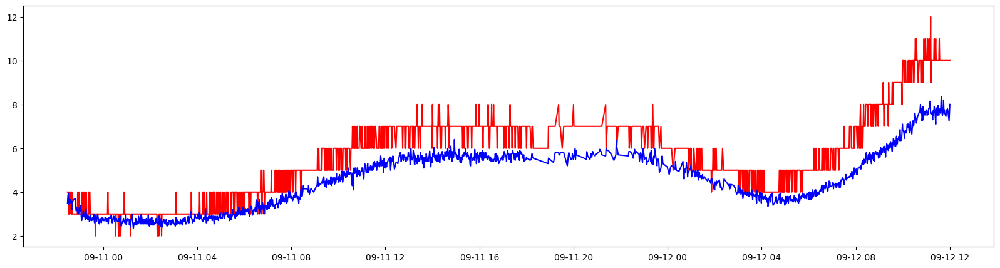

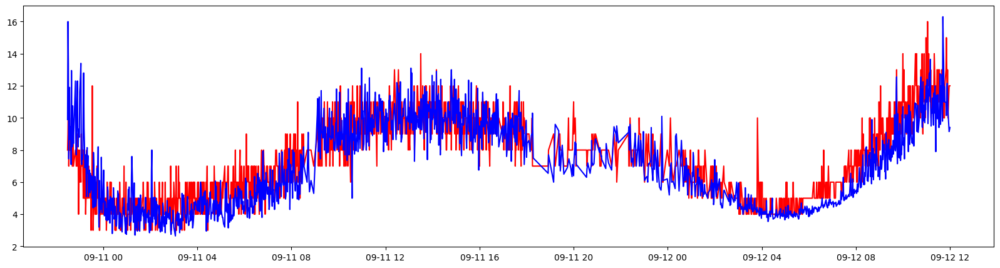

In [41]:
a1 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN1])
a1 = a1.dropna()
x = a1['created_at']
y1 = a1['PM2.5_ppb']
y2 = a1['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y1,'r')
plt.plot(x,y2,'b')

x = a1['created_at']
y3 = a1['PM10_ppb']
y4 = a1['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y3,'r')
plt.plot(x,y4,'b')

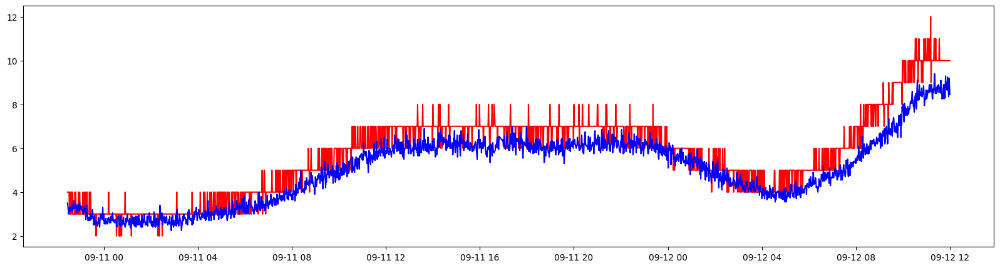

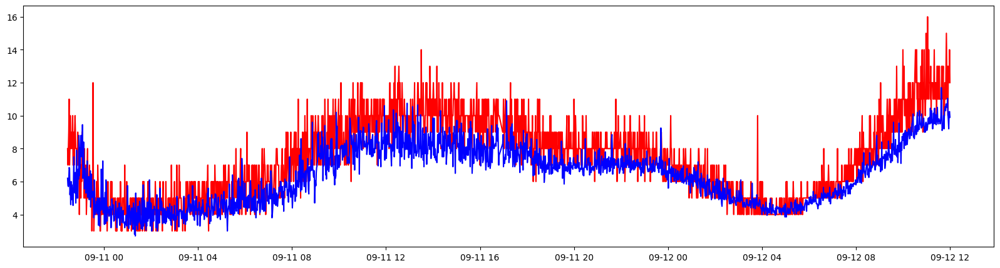

In [42]:
a2 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN2])
a2 = a2.dropna()
a2 = a2[a2['PM2.5'] <= 999]
x = a2['created_at']
z1 = a2['PM2.5_ppb']
z2 = a2['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z1,'r')
plt.plot(x,z2,'b')

x = a2['created_at']
z3 = a2['PM10_ppb']
z4 = a2['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z3,'r')
plt.plot(x,z4,'b')

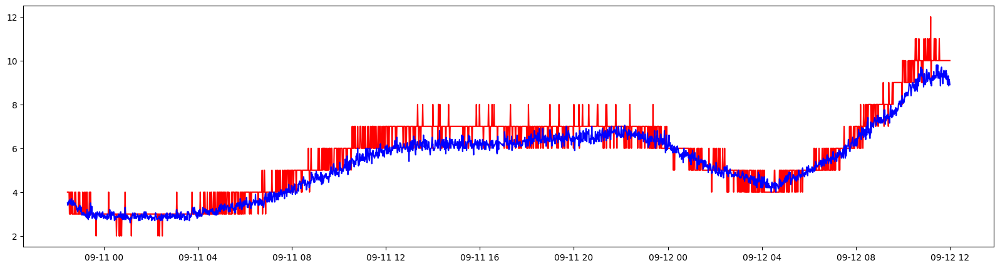

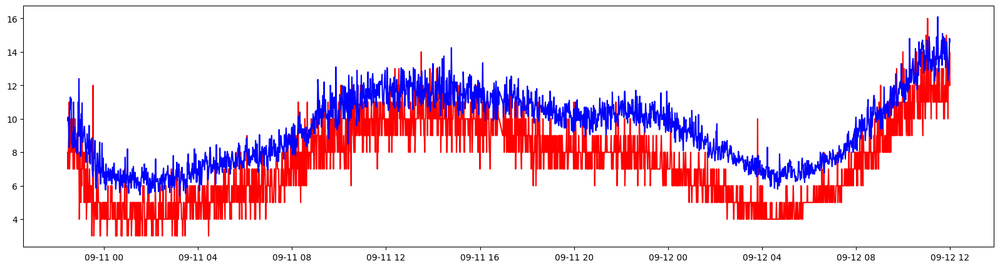

In [43]:
a3 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN3])
a3 = a3.dropna()
x = a3['created_at']
s1 = a3['PM2.5_ppb']
s2 = a3['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a3['created_at']
s3 = a3['PM10_ppb']
s4 = a3['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

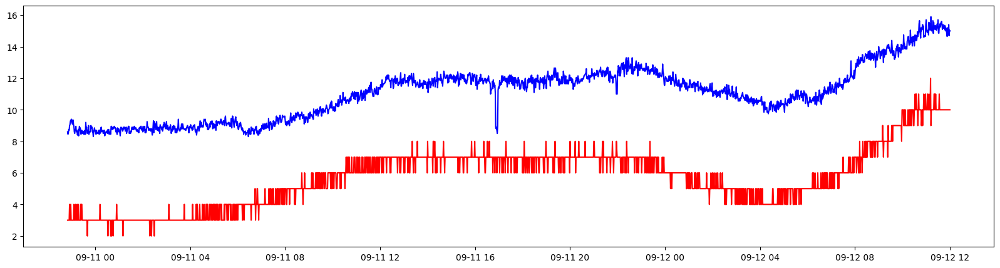

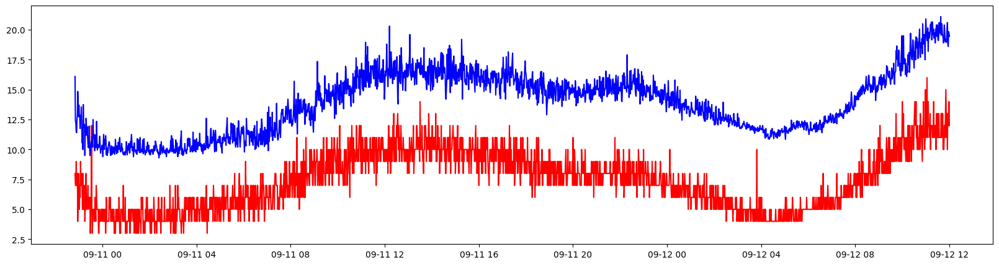

In [44]:
a4 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN4])
a4 = a4.dropna()
x = a4['created_at']
t1 = a4['PM2.5_ppb']
t2 = a4['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t1,'r')
plt.plot(x,t2,'b')

x = a4['created_at']
t3 = a4['PM10_ppb']
t4 = a4['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t3,'r')
plt.plot(x,t4,'b')

In [45]:
o = [a1, a2, a3, a4]
y = [y2, z2, s2, t2]
y_ = [y1, z1, s1, t1]

npts=[None] * len(o)
lag = []
correlation = []
Node = ['PM2.5_BN1', 'PM2.5_BN2', 'PM2.5_BN3', 'PM2.5_BN4']

for i in range(0, len(o)):
    npts[i] = len(o[i])
    lags = np.arange(-npts[i] + 1, npts[i])
    lag.append(lags)
    ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
    ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
    correlation.append(ccor)
    maxlag = lags[np.argmax(ccor)]
    print('*************',Node[i],'***************')
    print("max correlation is at lag %d" % maxlag)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y[i], y_[i])
    print('Pearsons correlation: %.3f' % corr)
    MSE = mean_squared_error(y[i], y_[i])
    MAE = mean_absolute_error(y[i], y_[i])
    print("MSE PM2.5: ", MSE)
    print("MAE PM2.5: ", MAE)
    print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

# o = [a1,a2,a3,a4]
# y = [y2,z2,c2,d2]
# y_ = [y1,z1,c1,d1]

# npts=[None] * len(o)
# lag = []
# correlation = []
# Node = ['PM2.5_BN1', 'PM2.5_BN2', 'PM2.5_BN3', 'PM2.5_BN4']

# for i in range(0, len(o)):
#     npts[i] = len(o[i])
#     lags = np.arange(-npts[i] + 1, npts[i])
#     lag.append(lags)
#     ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
#     ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
#     correlation.append(ccor)
#     maxlag = lags[np.argmax(ccor)]
#     print('*************',Node[i],'***************')
#     print("max correlation is at lag %d" % maxlag)
#     print("max correlation is ", round(max(ccor),3))
#     corr, _ = pearsonr(y[i], y_[i])
#     print('Pearsons correlation: %.3f' % corr)
#     MSE = mean_squared_error(y[i], y_[i])
#     MAE = mean_absolute_error(y[i], y_[i])
#     print("MSE PM2.5: ", MSE)
#     print("MAE PM2.5: ", MAE)
#     print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

************* PM2.5_BN1 ***************
max correlation is at lag 0
max correlation is  0.963
Pearsons correlation: 0.964
MSE PM2.5:  1.6683898835978836
MAE PM2.5:  1.0614426807760142
RMSE PM2.5:  1.29166167536158
************* PM2.5_BN2 ***************
max correlation is at lag 0
max correlation is  0.956
Pearsons correlation: 0.957
MSE PM2.5:  0.8019521741071427
MAE PM2.5:  0.7312508928571428
RMSE PM2.5:  0.8955178245613779
************* PM2.5_BN3 ***************
max correlation is at lag 0
max correlation is  0.961
Pearsons correlation: 0.962
MSE PM2.5:  0.43419248505131636
MAE PM2.5:  0.5275470771976797
RMSE PM2.5:  0.6589328380429347
************* PM2.5_BN4 ***************
max correlation is at lag -2
max correlation is  0.92
Pearsons correlation: 0.920
MSE PM2.5:  29.10942316172507
MAE PM2.5:  5.345253369272237
RMSE PM2.5:  5.3953149270200225


In [46]:
o = [a1, a2, a3, a4]
y = [y3, z3, s3, t3]
y_ = [y4, z4, s4, t4]

npts=[None] * len(o)
lag = []
correlation = []
Node = ['PM10_BN1', 'PM10_BN2','PM10_BN3', 'PM10_BN4']

for i in range(0, len(o)):
    npts[i] = len(o[i])
    lags = np.arange(-npts[i] + 1, npts[i])
    lag.append(lags)
    ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
    ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
    correlation.append(ccor)
    maxlag = lags[np.argmax(ccor)]
    print('*************',Node[i],'***************')
    print("max correlation is at lag %d" % maxlag)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y[i], y_[i])
    print('Pearsons correlation: %.3f' % corr)
    MSE = mean_squared_error(y[i], y_[i])
    MAE = mean_absolute_error(y[i], y_[i])
    print("MSE PM10: ", MSE)
    print("MAE PM10: ", MAE)
    print("RMSE PM10: ", np.sqrt(mean_squared_error(y[i], y_[i])))

# o = [a1,a2,a3,a4]
# y = [y3,z3,c3,d3]
# y_ = [y4,z4,c4,d4]

# npts=[None] * len(o)
# lag = []
# correlation = []
# Node = ['PM10_BN1', 'PM10_BN2', 'PM10_BN3', 'PM10_BN4']

# for i in range(0, len(o)):
#     npts[i] = len(o[i])
#     lags = np.arange(-npts[i] + 1, npts[i])
#     lag.append(lags)
#     ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
#     ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
#     correlation.append(ccor)
#     maxlag = lags[np.argmax(ccor)]
#     print('*************',Node[i],'***************')
#     print("max correlation is at lag %d" % maxlag)
#     print("max correlation is ", round(max(ccor),3))
#     corr, _ = pearsonr(y[i], y_[i])
#     print('Pearsons correlation: %.3f' % corr)
#     MSE = mean_squared_error(y[i], y_[i])
#     MAE = mean_absolute_error(y[i], y_[i])
#     print("MSE PM2.5: ", MSE)
#     print("MAE PM2.5: ", MAE)
#     print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

************* PM10_BN1 ***************
max correlation is at lag 3
max correlation is  0.83
Pearsons correlation: 0.829
MSE PM10:  2.444082855379189
MAE PM10:  1.1957889476778365
RMSE PM10:  1.5633562790928974
************* PM10_BN2 ***************
max correlation is at lag 7
max correlation is  0.843
Pearsons correlation: 0.839
MSE PM10:  2.7325904723214287
MAE PM10:  1.2682803571428574
RMSE PM10:  1.6530548908978882
************* PM10_BN3 ***************
max correlation is at lag 0
max correlation is  0.861
Pearsons correlation: 0.861
MSE PM10:  5.455102733154842
MAE PM10:  2.078178937974119
RMSE PM10:  2.335616135659891
************* PM10_BN4 ***************
max correlation is at lag 3
max correlation is  0.845
Pearsons correlation: 0.842
MSE PM10:  43.74789055256065
MAE PM10:  6.463513926325247
RMSE PM10:  6.61421881650136


# Node 1 Coefficients


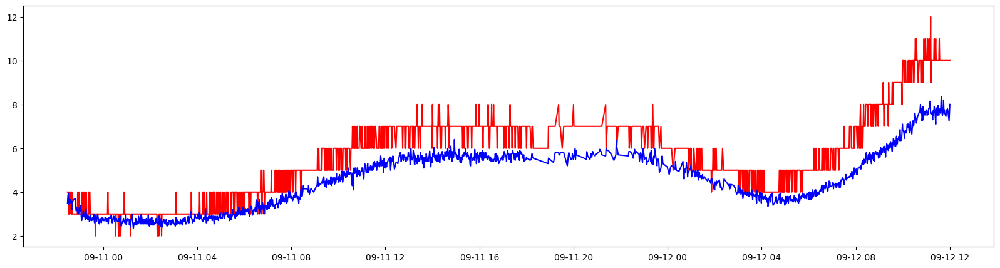

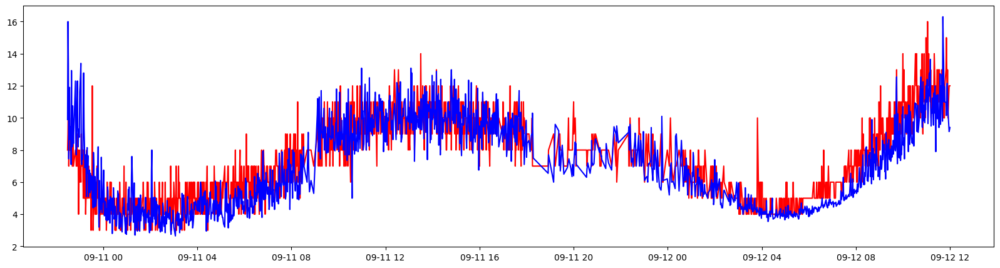

In [47]:
a1 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN1])
a1 = a1.dropna()
a1 = a1[a1['PM2.5'] <= 999]
x = a1['created_at']
y1 = a1['PM2.5_ppb']
y2 = a1['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y1,'r')
plt.plot(x,y2,'b')

x = a1['created_at']
y3 = a1['PM10_ppb']
y4 = a1['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y3,'r')
plt.plot(x,y4,'b')

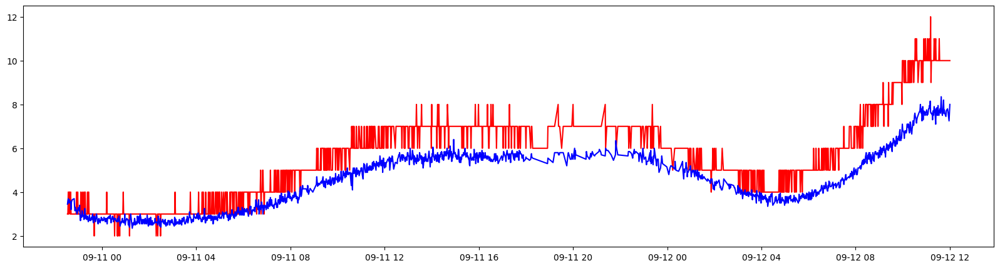

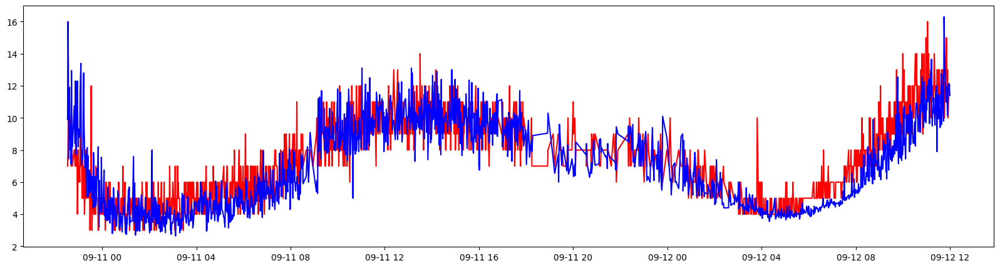

In [48]:
a1['PM2.5_shift'] = a1['PM2.5'].shift(0)
a1['PM10_shift'] = a1['PM10'].shift(3)

a1 = a1.dropna()
x = a1['created_at']
y_1 = a1['PM2.5_ppb']
y_2 = a1['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_1,'r')
plt.plot(x,y_2,'b')

x = a1['created_at']
y_3 = a1['PM10_ppb']
y_4 = a1['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_3,'r')
plt.plot(x,y_4,'b')

In [49]:
npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_1 - y_1.mean(), y_2 - y_2.mean(), mode='full')
ccor = ccov / (npts * y_1.std() * y_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_2, y_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_2, y_1)
MAE = mean_absolute_error(y_2, y_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y_2, y_1)))

npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_3 - y_3.mean(), y_4 - y_4.mean(), mode='full')
ccor = ccov / (npts * y_3.std() * y_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_4, y_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_4, y_3)
MAE = mean_absolute_error(y_4, y_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(y_4, y_3)))

max correlation is at lag 0
max correlation is  0.963
Pearsons correlation: 0.964
MSE PM2.5:  1.6711653074204946
MAE PM2.5:  1.0628763250883393
RMSE PM2.5:  1.2927355906837619
max correlation is at lag -6
max correlation is  0.826
Pearsons correlation: 0.818
MSE PM10:  2.601428702591284
MAE PM10:  1.220200824499411
RMSE PM10:  1.6128945106829784


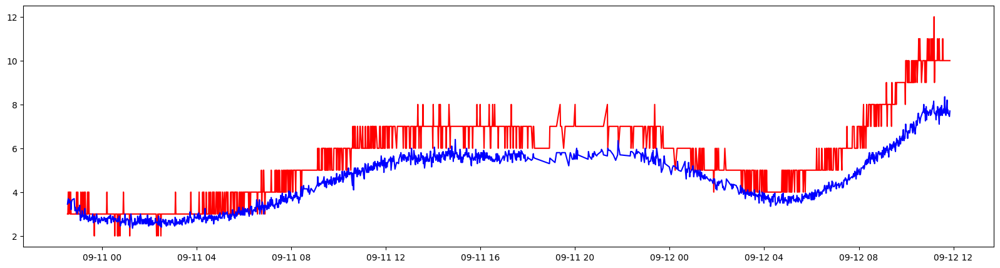

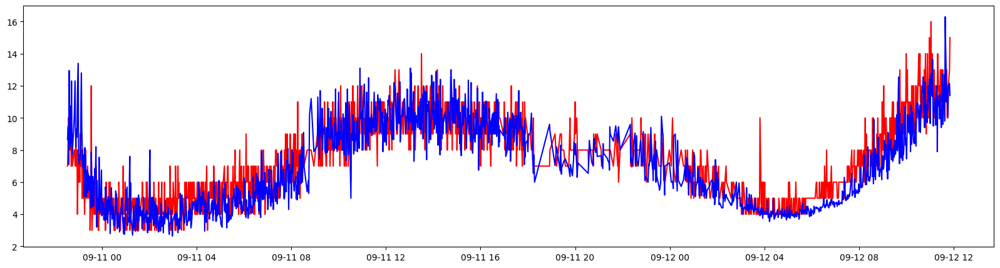

In [50]:
a1['PM2.5_shift'] = a1['PM2.5_shift'].shift(0)
a1['PM10_shift'] = a1['PM10_shift'].shift(-6)

a1 = a1.dropna()
x = a1['created_at']
y_1 = a1['PM2.5_ppb']
y_2 = a1['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_1,'r')
plt.plot(x,y_2,'b')

x = a1['created_at']
y_3 = a1['PM10_ppb']
y_4 = a1['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_3,'r')
plt.plot(x,y_4,'b')

In [51]:
npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_1 - y_1.mean(), y_2 - y_2.mean(), mode='full')
ccor = ccov / (npts * y_1.std() * y_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_2, y_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_2, y_1)
MAE = mean_absolute_error(y_2, y_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y_2, y_1)))

npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_3 - y_3.mean(), y_4 - y_4.mean(), mode='full')
ccor = ccov / (npts * y_3.std() * y_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_4, y_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_4, y_3)
MAE = mean_absolute_error(y_4, y_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(y_4, y_3)))

max correlation is at lag 0
max correlation is  0.962
Pearsons correlation: 0.963
MSE PM2.5:  1.658286756501182
MAE PM2.5:  1.0585189125295509
RMSE PM2.5:  1.2877448336146342
max correlation is at lag 0
max correlation is  0.837
Pearsons correlation: 0.838
MSE PM10:  2.312779809101655
MAE PM10:  1.1725277777777778
RMSE PM10:  1.5207826304576386


In [52]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = a1['PM2.5_shift']
y = a1['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')

Coefficients:  [1.40009069]
Intercept:  -0.7580193921832041
R2  0.9339579634991081
MAE of simple linear regression of  0.3785074408504323
MSE of simple linear regression 0.25144947533556333
RMSE of simple linear regression 0.5014473804254673
Test data Spearman correlation of simple linear regression: 0.952


In [53]:

X = a1['PM10_shift']
y = a1['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')

Coefficients:  [0.80818618]
Intercept:  1.7198942393222412
R2  0.7200683126873783
MAE of simple linear regression of  1.0147073481402704
MSE of simple linear regression 1.670221798944653
RMSE of simple linear regression 1.2923706120709544
Test data Spearman correlation of simple linear regression: 0.852


# Node 2 Coefficients

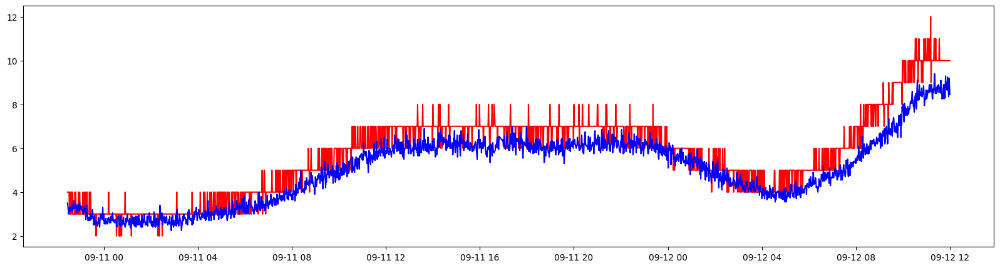

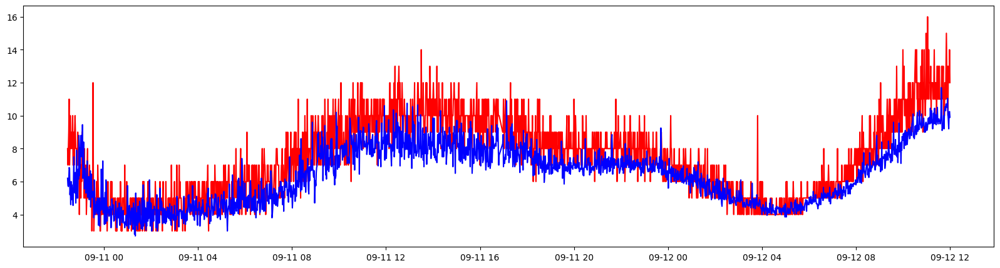

In [68]:
a2 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN2])
a2 = a2.dropna()
a2 = a2[a2['PM2.5'] <= 999]
x = a2['created_at']
z1 = a2['PM2.5_ppb']
z2 = a2['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z1,'r')
plt.plot(x,z2,'b')

x = a2['created_at']
z3 = a2['PM10_ppb']
z4 = a2['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z3,'r')
plt.plot(x,z4,'b')

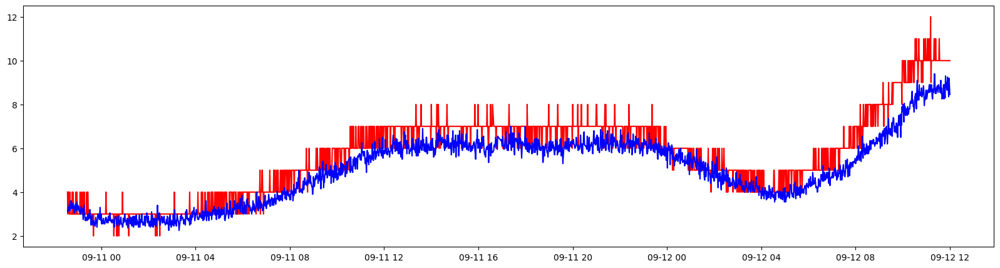

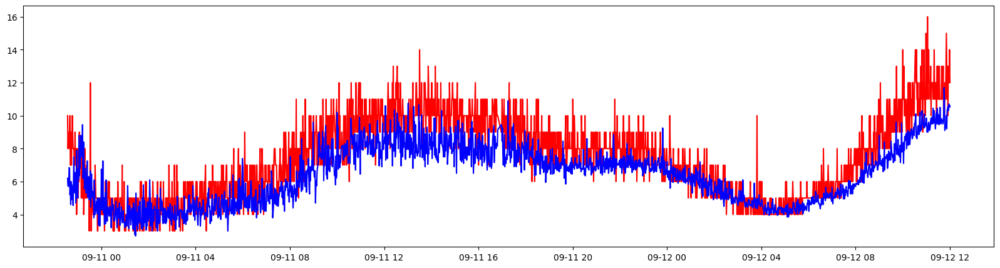

In [69]:
a2['PM2.5_shift'] = a2['PM2.5'].shift(0)
a2['PM10_shift'] = a2['PM10'].shift(7)

a2 = a2.dropna()
x = a2['created_at']
z_1 = a2['PM2.5_ppb']
z_2 = a2['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_1,'r')
plt.plot(x,z_2,'b')

x = a2['created_at']
z_3 = a2['PM10_ppb']
z_4 = a2['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_3,'r')
plt.plot(x,z_4,'b')

In [56]:
npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_1 - z_1.mean(), z_2 - z_2.mean(), mode='full')
ccor = ccov / (npts * z_1.std() * z_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_2, z_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_2, z_1)
MAE = mean_absolute_error(z_2, z_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(z_2, z_1)))

npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_3 - z_3.mean(), z_4 - z_4.mean(), mode='full')
ccor = ccov / (npts * z_3.std() * z_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_4, z_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_4, z_3)
MAE = mean_absolute_error(z_4, z_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(z_4, z_3)))

max correlation is at lag 0
max correlation is  0.956
Pearsons correlation: 0.956
MSE PM2.5:  0.8030756247201075
MAE PM2.5:  0.7316175548589342
RMSE PM2.5:  0.8961448681547574
max correlation is at lag 2
max correlation is  0.837
Pearsons correlation: 0.835
MSE PM10:  2.7935161925660545
MAE PM10:  1.2880349305866545
RMSE PM10:  1.6713815221444968


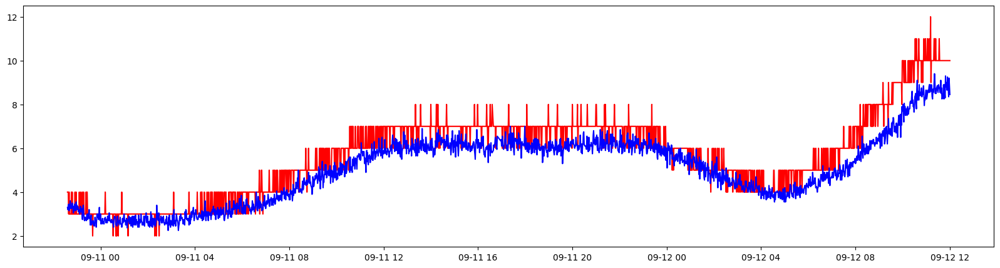

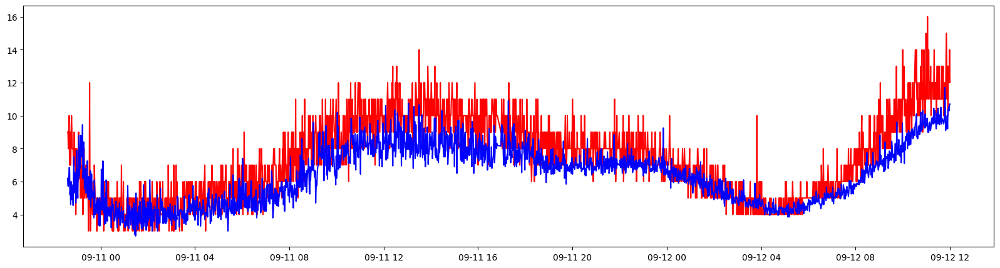

In [70]:
a2['PM2.5_shift'] = a2['PM2.5_shift'].shift(0)
a2['PM10_shift'] = a2['PM10_shift'].shift(2)

a2 = a2.dropna()
x = a2['created_at']
z_1 = a2['PM2.5_ppb']
z_2 = a2['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_1,'r')
plt.plot(x,z_2,'b')

x = a2['created_at']
z_3 = a2['PM10_ppb']
z_4 = a2['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_3,'r')
plt.plot(x,z_4,'b')

In [71]:
npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_1 - z_1.mean(), z_2 - z_2.mean(), mode='full')
ccor = ccov / (npts * z_1.std() * z_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_2, z_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_2, z_1)
MAE = mean_absolute_error(z_2, z_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(z_2, z_1)))

npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_3 - z_3.mean(), z_4 - z_4.mean(), mode='full')
ccor = ccov / (npts * z_3.std() * z_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_4, z_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_4, z_3)
MAE = mean_absolute_error(z_4, z_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(z_4, z_3)))

max correlation is at lag 0
max correlation is  0.956
Pearsons correlation: 0.956
MSE PM2.5:  0.8034672209771402
MAE PM2.5:  0.7318476019722098
RMSE PM2.5:  0.8963633308972094
max correlation is at lag 0
max correlation is  0.839
Pearsons correlation: 0.839
MSE PM10:  2.76495457552667
MAE PM10:  1.279956073509637
RMSE PM10:  1.6628152559820557


In [72]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a2['PM2.5_shift']
y = a2['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')


Coefficients:  [1.1665825]
Intercept:  -0.17163938035707904
R2  0.919587527792195
MAE of simple linear regression of  0.41132159128760326
MSE of simple linear regression 0.28688171372911414
RMSE of simple linear regression 0.5356133995048239
Test data Spearman correlation of simple linear regression: 0.938


In [73]:

X = a2['PM10_shift']
y = a2['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')


Coefficients:  [1.16598319]
Intercept:  -0.08544646496809882
R2  0.6586909024915582
MAE of simple linear regression of  1.0942555561276928
MSE of simple linear regression 2.0045454705551626
RMSE of simple linear regression 1.4158197168266737
Test data Spearman correlation of simple linear regression: 0.823


# **node3**

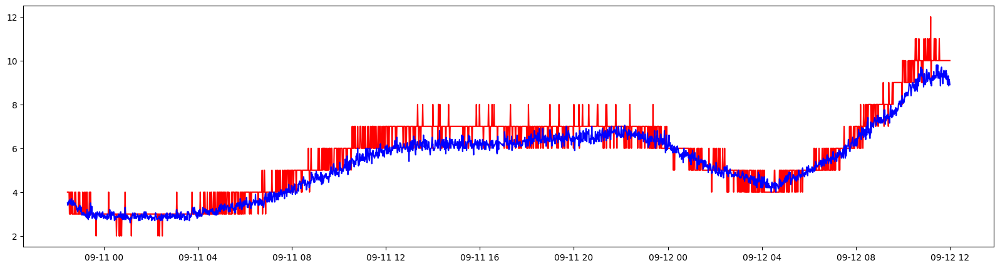

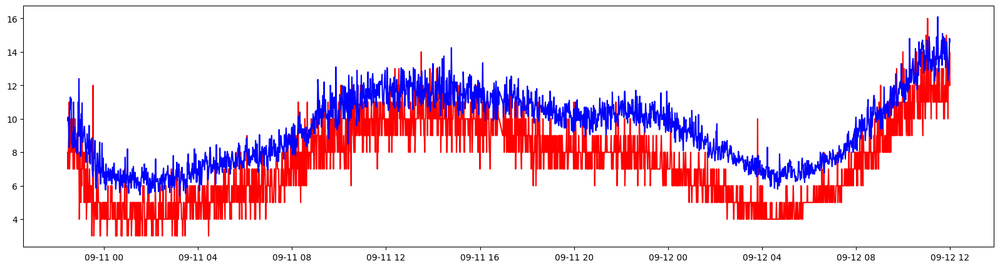

In [60]:
a3 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN3])
a3 = a3.dropna()
a3 = a3[a3['PM2.5'] <= 999]
x = a3['created_at']
s1 = a3['PM2.5_ppb']
s2 = a3['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a3['created_at']
s3 = a3['PM10_ppb']
s4 = a3['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

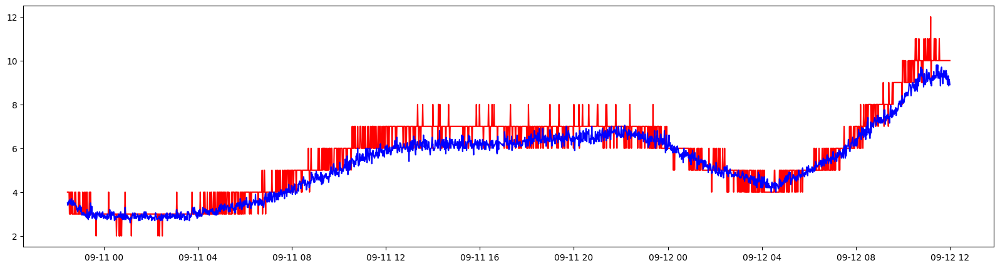

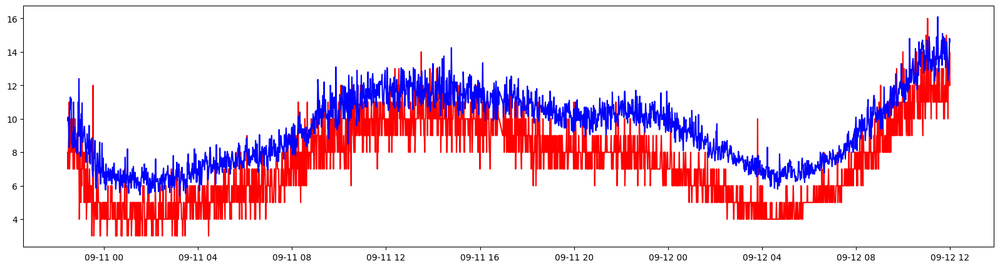

In [61]:
a3['PM2.5_shift'] = a3['PM2.5'].shift(0)
a3['PM10_shift'] = a3['PM10'].shift(0)

a3 = a3.dropna()
x = a3['created_at']
s_1 = a3['PM2.5_ppb']
s_2 = a3['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a3['created_at']
s_3 = a3['PM10_ppb']
s_4 = a3['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [62]:
npts = len(a3)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a3)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.961
Pearsons correlation: 0.962
MSE PM2.5:  0.43419248505131636
MAE PM2.5:  0.5275470771976797
RMSE PM2.5:  0.6589328380429347
max correlation is at lag 0
max correlation is  0.861
Pearsons correlation: 0.861
MSE PM10:  5.455102733154842
MAE PM10:  2.078178937974119
RMSE PM10:  2.335616135659891


In [63]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a3['PM2.5_shift']
y = a3['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')






    # /pm10

X = a3['PM10_shift']
y = a3['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')



Coefficients:  [1.11336738]
Intercept:  -0.23322254865305947
R2  0.9241330129225951
MAE of simple linear regression of  0.4043145530128473
MSE of simple linear regression 0.27584587871928273
RMSE of simple linear regression 0.5252103185575115
Test data Spearman correlation of simple linear regression: 0.935
Coefficients:  [0.99409814]
Intercept:  -1.9239681811069653
R2  0.7337139165564595
MAE of simple linear regression of  0.9174829397358106
MSE of simple linear regression 1.3572861921563557
RMSE of simple linear regression 1.1650262624320344
Test data Spearman correlation of simple linear regression: 0.865


# **node 4**


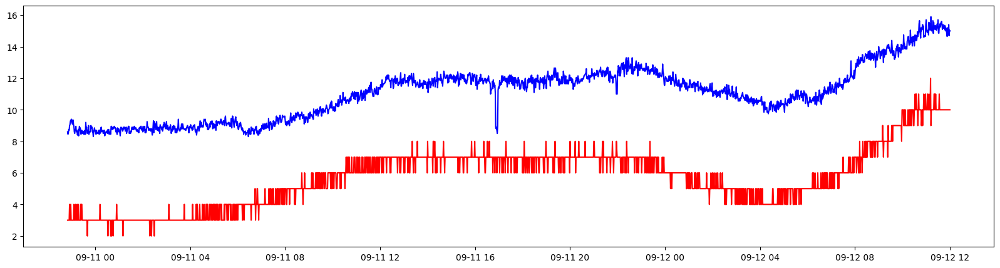

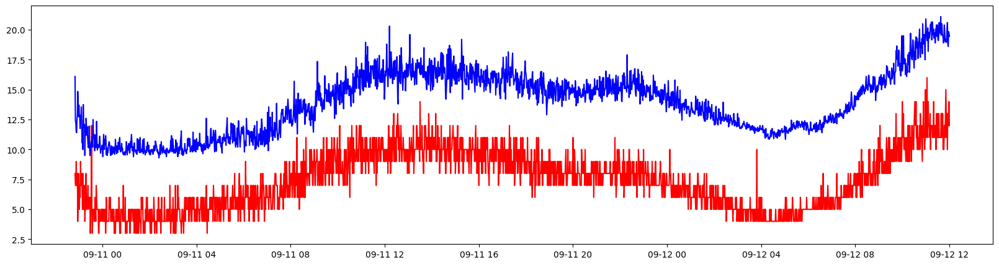

In [74]:
a4 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN4])
a4 = a4.dropna()
a4 = a4[a4['PM2.5'] <= 999]
x = a4['created_at']
t1 = a4['PM2.5_ppb']
t2 = a4['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t1,'r')
plt.plot(x,t2,'b')

x = a4['created_at']
t3 = a4['PM10_ppb']
t4 = a4['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t3,'r')
plt.plot(x,t4,'b')

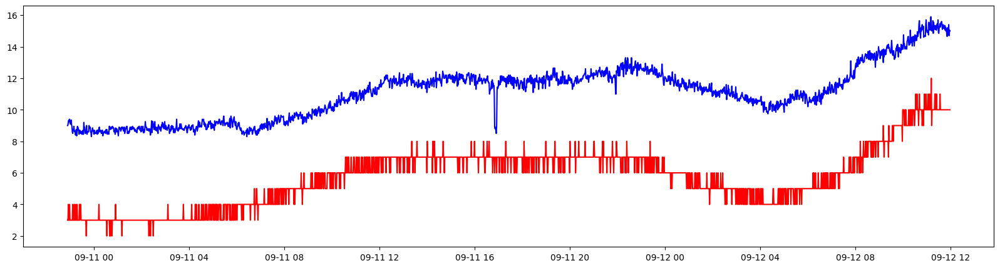

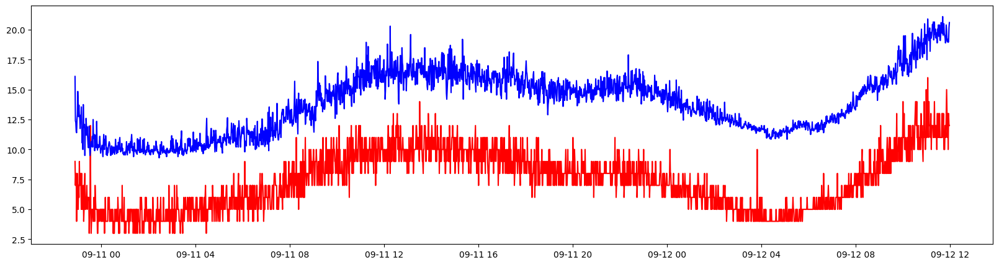

In [75]:
a4['PM2.5_shift'] = a4['PM2.5'].shift(-2)
a4['PM10_shift'] = a4['PM10'].shift(3)

a4 = a4.dropna()
x = a4['created_at']
t_1 = a4['PM2.5_ppb']
t_2 = a4['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t_1,'r')
plt.plot(x,t_2,'b')

x = a4['created_at']
t_3 = a4['PM10_ppb']
t_4 = a4['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t_3,'r')
plt.plot(x,t_4,'b')

In [76]:
npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(t_1 - t_1.mean(), t_2 - t_2.mean(), mode='full')
ccor = ccov / (npts * t_1.std() * t_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(t_2, t_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(t_2, t_1)
MAE = mean_absolute_error(t_2, t_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(t_2, t_1)))

npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(t_3 - t_3.mean(), t_4 - t_4.mean(), mode='full')
ccor = ccov / (npts * t_3.std() * t_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(t_4, t_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(t_4, t_3)
MAE = mean_absolute_error(t_4, t_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(t_4, t_3)))

max correlation is at lag 0
max correlation is  0.922
Pearsons correlation: 0.923
MSE PM2.5:  29.147812002701485
MAE PM2.5:  5.3509608284556505
RMSE PM2.5:  5.39887136378535
max correlation is at lag 1
max correlation is  0.843
Pearsons correlation: 0.841
MSE PM10:  43.65267418730302
MAE PM10:  6.456678072940116
RMSE PM10:  6.607017041547798


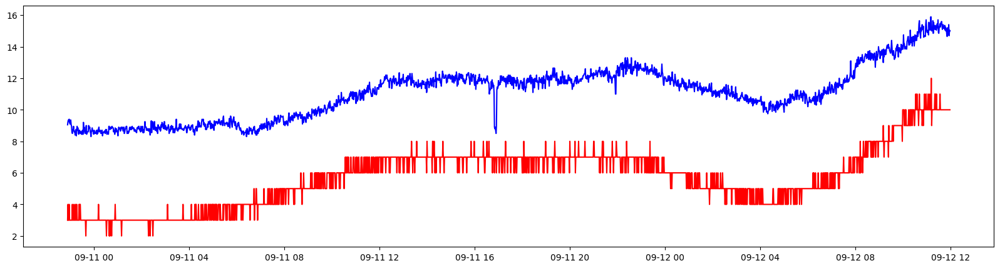

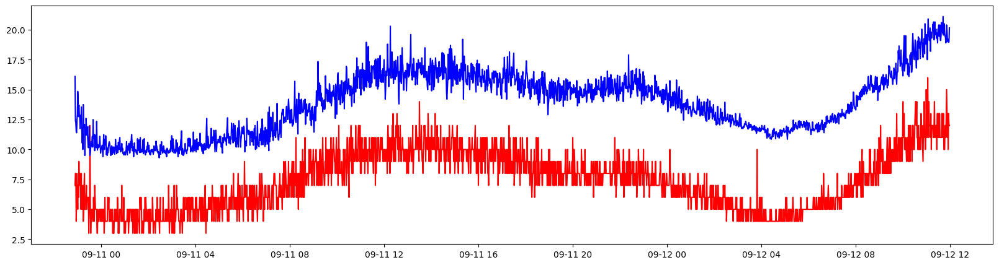

In [77]:
a4['PM2.5_shift'] = a4['PM2.5_shift'].shift(0)
a4['PM10_shift'] = a4['PM10_shift'].shift(1)

a4 = a4.dropna()
x = a4['created_at']
t_1 = a4['PM2.5_ppb']
t_2 = a4['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t_1,'r')
plt.plot(x,t_2,'b')

x = a4['created_at']
t_3 = a4['PM10_ppb']
t_4 = a4['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t_3,'r')
plt.plot(x,t_4,'b')

In [78]:
npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(t_1 - t_1.mean(), t_2 - t_2.mean(), mode='full')
ccor = ccov / (npts * t_1.std() * t_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(t_2, t_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(t_2, t_1)
MAE = mean_absolute_error(t_2, t_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(t_2, t_1)))

npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(t_3 - t_3.mean(), t_4 - t_4.mean(), mode='full')
ccor = ccov / (npts * t_3.std() * t_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(t_4, t_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(t_4, t_3)
MAE = mean_absolute_error(t_4, t_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(t_4, t_3)))

max correlation is at lag 0
max correlation is  0.922
Pearsons correlation: 0.923
MSE PM2.5:  29.14472543153153
MAE PM2.5:  5.350668468468468
RMSE PM2.5:  5.398585502845308
max correlation is at lag 0
max correlation is  0.844
Pearsons correlation: 0.844
MSE PM10:  43.574123139639646
MAE PM10:  6.454586486486487
RMSE PM10:  6.601069848110959


In [79]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a4['PM2.5_shift']
y = a4['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')






    # /pm10

X = a4['PM10_shift']
y = a4['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')



Coefficients:  [1.01924731]
Intercept:  -5.557325311305914
R2  0.8528087709739864
MAE of simple linear regression of  0.5670172748530791
MSE of simple linear regression 0.477235842503582
RMSE of simple linear regression 0.6908225839559546
Test data Spearman correlation of simple linear regression: 0.906
Coefficients:  [0.79102766]
Intercept:  -3.551882355813002
R2  0.7054433432364495
MAE of simple linear regression of  0.9795414948533168
MSE of simple linear regression 1.5276794548341721
RMSE of simple linear regression 1.2359933069536309
Test data Spearman correlation of simple linear regression: 0.848


## **node 5**


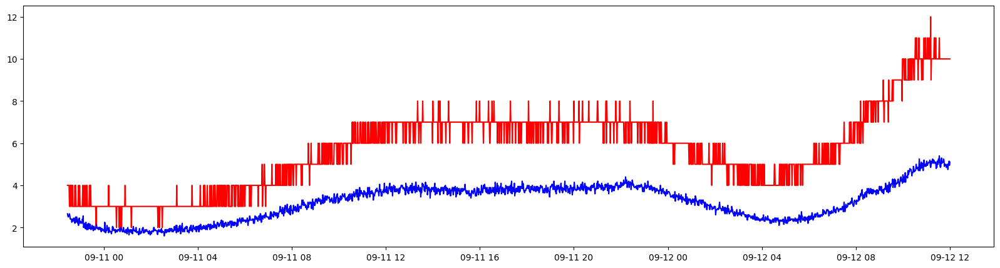

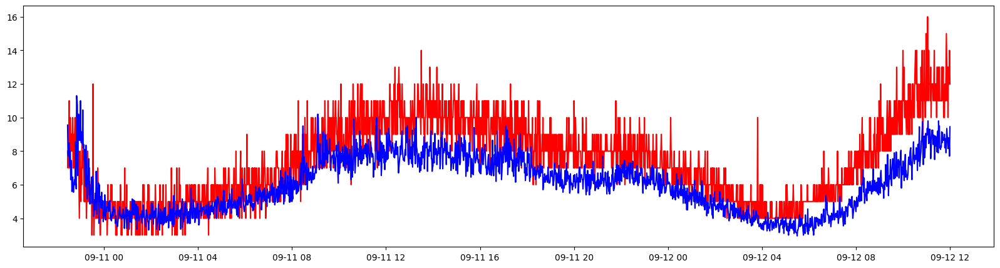

In [ ]:
a5 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN5])
a5 = a5.dropna()
a5 = a5[a5['PM2.5'] <= 999]
x = a5['created_at']
p1 = a5['PM2.5_ppb']
p2 = a5['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p1,'r')
plt.plot(x,p2,'b')

x = a5['created_at']
p3 = a5['PM10_ppb']
p4 = a5['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p3,'r')
plt.plot(x,p4,'b')

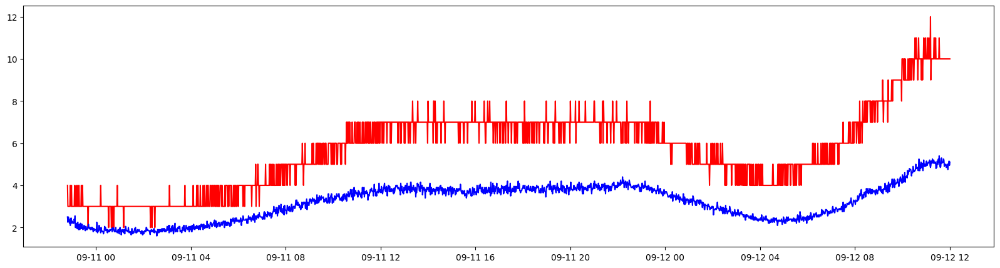

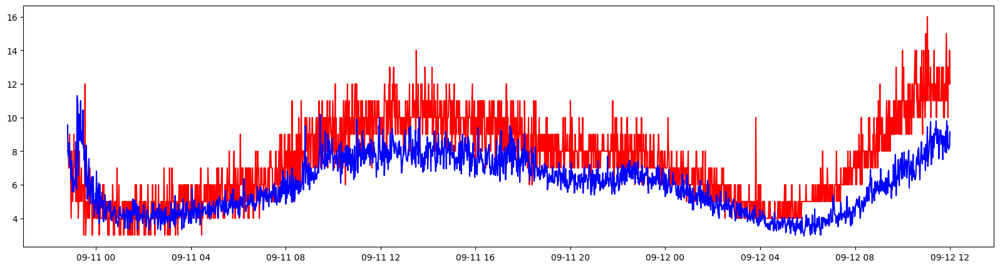

In [ ]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(21)

a5 = a5.dropna()
x = a5['created_at']
p_1 = a5['PM2.5_ppb']
p_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p_1,'r')
plt.plot(x,p_2,'b')

x = a5['created_at']
p_3 = a5['PM10_ppb']
p_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p_3,'r')
plt.plot(x,p_4,'b')

In [ ]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(p_1 - p_1.mean(), p_2 - p_2.mean(), mode='full')
ccor = ccov / (npts * p_1.std() * p_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(p_2, p_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(p_2, p_1)
MAE = mean_absolute_error(p_2, p_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(p_2, p_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(p_3 - p_3.mean(), p_4 - p_4.mean(), mode='full')
ccor = ccov / (npts * p_3.std() * p_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(p_4, p_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(p_4, p_3)
MAE = mean_absolute_error(p_4, p_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(p_4, p_3)))

max correlation is at lag 0
max correlation is  0.941
Pearsons correlation: 0.941
MSE PM2.5:  7.657411950201884
MAE PM2.5:  2.535942126514132
RMSE PM2.5:  2.767202910919596
max correlation is at lag -42
max correlation is  0.792
Pearsons correlation: 0.771
MSE PM10:  4.3993696590399285
MAE PM10:  1.676768954688201
RMSE PM10:  2.097467439327707


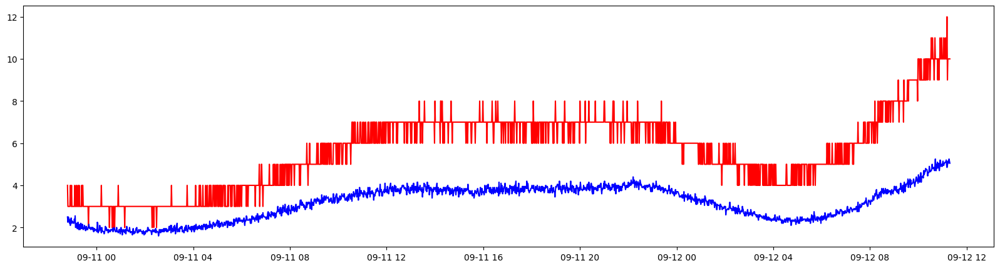

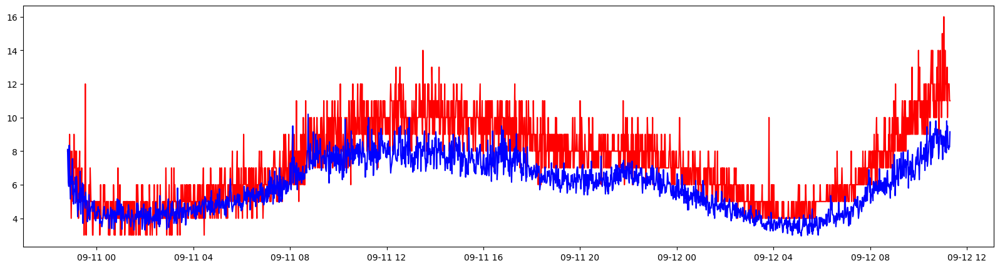

In [ ]:
a5['PM2.5_shift'] = a5['PM2.5_shift'].shift(0)
a5['PM10_shift'] = a5['PM10_shift'].shift(-42)

a5 = a5.dropna()
x = a5['created_at']
p_1 = a5['PM2.5_ppb']
p_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p_1,'r')
plt.plot(x,p_2,'b')

x = a5['created_at']
p_3 = a5['PM10_ppb']
p_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p_3,'r')
plt.plot(x,p_4,'b')

In [ ]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(p_1 - p_1.mean(), p_2 - p_2.mean(), mode='full')
ccor = ccov / (npts * p_1.std() * p_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(p_2, p_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(p_2, p_1)
MAE = mean_absolute_error(p_2, p_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(p_2, p_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(p_3 - p_3.mean(), p_4 - p_4.mean(), mode='full')
ccor = ccov / (npts * p_3.std() * p_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(p_4, p_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(p_4, p_3)
MAE = mean_absolute_error(p_4, p_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(p_4, p_3)))

max correlation is at lag 0
max correlation is  0.935
Pearsons correlation: 0.936
MSE PM2.5:  7.313155572473708
MAE PM2.5:  2.4876611796982164
RMSE PM2.5:  2.704284669274614
max correlation is at lag 0
max correlation is  0.842
Pearsons correlation: 0.842
MSE PM10:  3.609664823959762
MAE PM10:  1.5231604938271606
RMSE PM10:  1.8999117937314254


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a5['PM2.5_shift']
y = a5['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')






    # /pm10

X = a5['PM10_shift']
y = a5['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')



Coefficients:  [2.04935917]
Intercept:  -0.8083273799306223
R2  0.8741272732344105
MAE of simple linear regression of  0.4625878156371393
MSE of simple linear regression 0.40487341407964716
RMSE of simple linear regression 0.6362966400034241
Test data Spearman correlation of simple linear regression: 0.917
Coefficients:  [1.23317977]
Intercept:  -0.0247018968261008
R2  0.7116993743320474
MAE of simple linear regression of  0.9908320634649402
MSE of simple linear regression 1.6564978152236893
RMSE of simple linear regression 1.2870500437914951
Test data Spearman correlation of simple linear regression: 0.861


# Plotting Calibrated data

In [82]:
import plotly.express as px
import pandas as pd

# Define function to calculate modified values
def calculate_values(df, m_pm25, c_pm25, m_pm10, c_pm10):
    df['PM2.5_c'] = df['PM2.5'] * m_pm25 + c_pm25
    df['PM10_c'] = df['PM10'] * m_pm10 + c_pm10
    return df

# Define coefficients for each file
coefficients = {


    'bn_1_without_outliers': {'m_pm25': 1.40009069, 'c_pm25': -0.7580193921832041 , 'm_pm10': 0.80818618, 'c_pm10': 1.7198942393222412},
    'bn_2_without_outliers': {'m_pm25': 1.1665825, 'c_pm25': -0.17163938035707904, 'm_pm10': 1.16598319, 'c_pm10': -0.08544646496809882},
    'bn_3_without_outliers': {'m_pm25': 1.11336738, 'c_pm25': -0.23322254865305947, 'm_pm10': 0.99409814, 'c_pm10': -1.9239681811069653},
    'bn_4_without_outliers': {'m_pm25': 1.01924731, 'c_pm25': -5.557325311305914, 'm_pm10': 0.79102766, 'c_pm10': -3.551882355813002},
    # 'bn_5_without_outliers': {'m_pm25': 2.04935917, 'c_pm25': -0.8083273799306223, 'm_pm10': 1.23317977, 'c_pm10': -0.0247018968261008}
}

# Applying coefficients for each file and saving calibrated data
filepaths = ['/content/bn_1_without_outliers.csv', '/content/bn_2_without_outliers.csv', '/content/bn_3_without_outliers.csv', '/content/bn_4_without_outliers.csv']

for filepath in filepaths:
    name_without_extension = filepath.split('/')[-1].split('.')[0]

    # Load data
    hourly_data = pd.read_csv(filepath, parse_dates=['created_at'])

    # Extract coefficients
    if name_without_extension in coefficients:
        coeff = coefficients[name_without_extension]
        m_pm25, c_pm25, m_pm10, c_pm10 = coeff['m_pm25'], coeff['c_pm25'], coeff['m_pm10'], coeff['c_pm10']
    else:
        raise ValueError(f"Unknown file: {name_without_extension}")

    # Calculate modified data
    hourly_data_modified = calculate_values(hourly_data, m_pm25, c_pm25, m_pm10, c_pm10)

    # Save calibrated data to CSV
    calibrated_filename = f'{name_without_extension}_calibrated_hourly.csv'
    hourly_data_modified.to_csv(calibrated_filename, index=False)
    print(f"Calibrated data for {name_without_extension} saved as {calibrated_filename}")

    # Plotting modified data
    fig = px.line(hourly_data_modified, x='created_at',
                  y=['PM2.5_c', 'PM10_c'],
                  title=f'Hourly Averages with Coefficients - {name_without_extension}')

    # Add range slider
    fig.update_layout(xaxis=dict(
        tickformat='%d %b',
        tickmode='linear',
        tick0=hourly_data_modified['created_at'].iloc[0],
        dtick='12H',
        tickangle=0,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="1w", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                # dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        )
    ))

    # Increase the width of the plot
    fig.update_layout(width=1000)  # Adjust the width as needed

    fig.show()

    # Save plot as HTML
    fig.write_html(f"{name_without_extension}_calibrated_hourly_plot.html")


Calibrated data for bn_1_without_outliers saved as bn_1_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_2_without_outliers saved as bn_2_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_3_without_outliers saved as bn_3_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_4_without_outliers saved as bn_4_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [83]:
import plotly.express as px
import pandas as pd

# Dictionary to store HTML plots
html_plots = {}

# List to store filenames for HTML plots
html_filenames = []

# Define function to calculate modified values
def calculate_values(df, m_pm25, c_pm25, m_pm10, c_pm10):
    df['PM2.5_c'] = df['PM2.5'] * m_pm25 + c_pm25
    df['PM10_c'] = df['PM10'] * m_pm10 + c_pm10
    return df

# Loop through parameters
for parameter in ['PM2.5_c', 'PM10_c']:
    fig = px.line(title=f'{parameter} Data')

    # Loop through uploaded files
    for filepath in filepaths:
        name_without_extension = filepath.split('/')[-1].split('.')[0]

        # Extract coefficients
        if name_without_extension in coefficients:
            coeff = coefficients[name_without_extension]
            m_pm25, c_pm25, m_pm10, c_pm10 = coeff['m_pm25'], coeff['c_pm25'], coeff['m_pm10'], coeff['c_pm10']
        else:
            raise ValueError(f"Unknown file: {name_without_extension}")

        # Load data
        hourly_data = pd.read_csv(filepath, parse_dates=['created_at'])

        # Calculate modified data
        hourly_data_modified = calculate_values(hourly_data, m_pm25, c_pm25, m_pm10, c_pm10)

        # Add trace to the plot using modified columns
        fig.add_scatter(x=hourly_data_modified['created_at'], y=hourly_data_modified[parameter],
                        mode='lines', name=name_without_extension)

    # Update layout
    fig.update_layout(xaxis_title='Time', yaxis_title=parameter, width=1000,
                      xaxis=dict(
                          tickformat='%d %b',
                          tickmode='linear',
                          tick0=hourly_data_modified['created_at'].iloc[0],
                          dtick='12H',
                          tickangle=0,
                          rangeselector=dict(
                              buttons=list([
                                  dict(count=1, label="1d", step="day", stepmode="backward"),
                                  dict(count=7, label="1w", step="day", stepmode="backward"),
                                  dict(count=1, label="1m", step="month", stepmode="backward"),
                                  # dict(count=1, label="1y", step="year", stepmode="backward"),
                                  dict(step="all")
                              ])
                          ),
                          rangeslider=dict(
                              visible=True
                          )
                      )
                      )

    fig.show()

    # Save plot as HTML
    html_content = fig.to_html(full_html=False, include_plotlyjs='cdn')
    html_plots[parameter] = html_content

    html_filename = f"{parameter}_data_plot.html"
    with open(html_filename, 'w') as f:
        f.write(html_content)
    html_filenames.append(html_filename)

# Display HTML filenames
print("HTML plots saved as:")
for filename in html_filenames:
    print(filename)


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/

HTML plots saved as:
PM2.5_c_data_plot.html
PM10_c_data_plot.html


# Plotting Aero + Nodes Calibrated data

In [84]:
import plotly.express as px
import pandas as pd

# Load the calibrated data for the outdoor nodes
n1 = pd.read_csv('/content/bn_1_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n2 = pd.read_csv('/content/bn_2_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n3 = pd.read_csv('/content/bn_3_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n4 = pd.read_csv('/content/bn_4_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
# n5 = pd.read_csv('/content/bn_5_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])

# Load the modified Aero data
aero = pd.read_csv('/content/modified_aero.csv', parse_dates=['created_at'])

# Create a figure for PM2.5
fig_pm25 = px.line(title='Outdoor Nodes - PM2.5')
fig_pm25.add_scatter(x=n1['created_at'], y=n1['PM2.5_c'], name='SDS_1')
fig_pm25.add_scatter(x=n2['created_at'], y=n2['PM2.5_c'], name='SDS_2')
fig_pm25.add_scatter(x=n3['created_at'], y=n3['PM2.5_c'], name='SDS_3')
fig_pm25.add_scatter(x=n4['created_at'], y=n4['PM2.5_c'], name='SDS_4')
# fig_pm25.add_scatter(x=n5['created_at'], y=n5['PM2.5_c'], name='SDS_5')
fig_pm25.add_scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='Aero')
fig_pm25.show()

# Create a figure for PM10
fig_pm10 = px.line(title='Outdoor Nodes - PM10')
fig_pm10.add_scatter(x=n1['created_at'], y=n1['PM10_c'], name='SDS_1')
fig_pm10.add_scatter(x=n2['created_at'], y=n2['PM10_c'], name='SDS_2')
fig_pm10.add_scatter(x=n3['created_at'], y=n3['PM10_c'], name='SDS_3')
fig_pm10.add_scatter(x=n4['created_at'], y=n4['PM10_c'], name='SDS_4')
# fig_pm10.add_scatter(x=n5['created_at'], y=n5['PM10_c'], name='SDS_5')
fig_pm10.add_scatter(x=aero['created_at'], y=aero['PM10_ppb'], name='Aero')
fig_pm10.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [85]:

fig_1 = go.Figure()
fig_1.add_trace(go.Scatter(x=bn1['created_at'], y=bn1['PM2.5'], name='n1'))
fig_1.add_scatter(x=n1['created_at'], y=n1['PM2.5_c'], name='n1_c')
fig_1.add_scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='Aero')

fig_1.update_layout(title='1 Raw vs Calibrated data PM2.5')
fig_1.update_xaxes()
fig_1.show()






